In [1]:
import os
import sys
threads_num = 2
os.environ["MKL_NUM_THREADS"] = f"{threads_num}" 
os.environ["NUMEXPR_NUM_THREADS"] = f"{threads_num}"
os.environ["OMP_NUM_THREADS"] = f"{threads_num}"
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import tqdm
import scipy
import numpy as np
import pandas as pd
import scipy.spatial as sp, scipy.cluster.hierarchy as hc
import genmodel

from utils import colors, sample_type_to_color, sample_type_to_label, export_legend, transform_model, merge_vdj_alleles, full_js_distance, full_shannon_entropy, draw_distances, get_distance_stats_test, draw_pvalues

sns.set_style("ticks")

In [2]:
DATA_DIR = "../data/gidoni_nat_comm/"
SYNTHETIC_DATA_DIR = "../data/human_synthetic_replicates/"
FIGURES_DIR = "../figures/figure_3/"

In [3]:
inds = list(range(1, 101))
inds.remove(97)

In [4]:
def draw(n_sequences, fontsize=60, exclude=[], output_suffix=''):
    prefix = DATA_DIR
    main_models = {ind : genmodel.GenModel(model_parms_file=prefix + f"/S{ind}_{n_sequences}_run/main_inference/final_parms.txt",
                                           marginals_file=prefix + f"/S{ind}_{n_sequences}_run/main_inference/final_marginals.txt") for ind in inds}
    transformed_main_models = {ind : merge_vdj_alleles(model) for ind, model in main_models.items()}
    replicate_models = {ind : genmodel.GenModel(model_parms_file=prefix + f"/S{ind}_data_replicate_{n_sequences}_run/main_inference/final_parms.txt",
                                           marginals_file=prefix + f"/S{ind}_data_replicate_{n_sequences}_run/main_inference/final_marginals.txt") for ind in inds}
    transformed_replicate_models = {ind : merge_vdj_alleles(model) for ind, model in replicate_models.items()}

    n_replicates = 30
    prefix = SYNTHETIC_DATA_DIR
    synthetic_replicate_models = [genmodel.GenModel(model_parms_file=prefix + f"/synthetic_replicate_{i}_{n_sequences}_run/main_inference/final_parms.txt",
                                           marginals_file=prefix + f"/synthetic_replicate_{i}_{n_sequences}_run/main_inference/final_marginals.txt") for i in range(n_replicates)]
    transformed_synthetic_models = [merge_vdj_alleles(m) for m in synthetic_replicate_models]
    synthetic_replicate_distances = [full_js_distance(transformed_synthetic_models[i],
                                                      transformed_synthetic_models[k],
                                                      exclude=[])\
                                               for i in range(n_replicates) for k in range(i+1, n_replicates)]
    draw_heatmap(inds,
                 transformed_main_models,
                 transformed_replicate_models,
                 transformed_synthetic_models,
                 lambda transformed_model_1, transformed_model_2: full_js_distance(transformed_model_1,
                                                                                   transformed_model_2,
                                                                                   exclude=exclude),
                 "Normalized JSD",
                 out_filename=os.path.join(FIGURES_DIR, f"{n_sequences}{output_suffix}.png"), 
                 fontsize=fontsize,
                 common_scale=(len(exclude) == 0))


In [5]:
def draw_heatmap(inds, transformed_main_models, transformed_replicate_models, transformed_synthetic_models, distance_function, title, out_filename, fontsize=60, common_scale=True):
    vmin, vmax = 1.1616636582726783, 3.6396560852375566
    n = len(inds)
    digits = 2
    figsize=100
    res_matrix = [[0 for i in range(n)] for i in range(n)]
    synthetic_replicate_distances = [distance_function(transformed_synthetic_models[i],
                                                       transformed_synthetic_models[k]) \
                                               for i in range(len(transformed_synthetic_models)) \
                                                   for k in range(i+1, len(transformed_synthetic_models))]
    average_synthetic_replicate_distance = np.mean(synthetic_replicate_distances)
    data_replicate_distances = [distance_function(transformed_main_models[inds[i]],
                                                  transformed_replicate_models[inds[i]]) \
                                               for i in range(n)]
    for i in range(n):
        for k in range(i+1, n):
            dist = distance_function(transformed_main_models[inds[i]],
                                     transformed_main_models[inds[k]]) / average_synthetic_replicate_distance
            if dist < 1:
                print(inds[i], inds[k])
            res_matrix[i][k] = dist
            res_matrix[k][i] = dist
    res_matrix = np.array(res_matrix)
    linkage = hc.linkage(sp.distance.squareform(res_matrix - 1 + np.identity(res_matrix.shape[0])), method='average')
    for i in range(res_matrix.shape[0]):
        res_matrix[i][i] = data_replicate_distances[i] / average_synthetic_replicate_distance
    fig = plt.figure(figsize=(figsize, figsize))

    if not common_scale:
        vmin, vmax = res_matrix.min(), res_matrix.max()
    new_cmap = plt.cm.viridis
    
    ax = sns.clustermap(res_matrix,
                   row_linkage=linkage,
                   col_linkage=linkage,
                   xticklabels=inds,
                   yticklabels=inds,
                   fmt=".1f",
                   cmap=new_cmap,
                   annot=True,
                   annot_kws={"fontsize": fontsize * 0.4},
                   linewidth=0.01,
                   figsize=(figsize, figsize),
                   vmin=vmin,
                   vmax=vmax,
                   cbar_kws={"shrink": 50.0})
    
    bottom, top = ax.ax_heatmap.get_ylim()
    ax.ax_heatmap.set_ylim(bottom + 0.5, top - 0.5)
    ax.cax.set_visible(False)
    plt.setp(ax.ax_heatmap.get_xticklabels(), fontsize=fontsize * 0.5)
    plt.setp(ax.ax_heatmap.get_yticklabels(), fontsize=fontsize * 0.5)
    plt.minorticks_off()
    ax.savefig(out_filename, format="png")
    plt.show()
    
    colorbar_filename = out_filename[:-4] + "_colorbar.png"
    fig = plt.figure(figsize=(5, 20))
    img = plt.imshow(np.array([[vmin, vmax]]), cmap="viridis")
    ax = plt.gca()
    cax = fig.add_axes([0.1, 0.2, 0.8, 0.6])
    cbar = plt.colorbar(img, orientation="vertical")
    cbar.ax.tick_params(labelsize=fontsize)
    ax.remove()
    cax.remove()
    plt.savefig(colorbar_filename, bbox_inches='tight')
    plt.show()

In [6]:
df_id_to_sample = pd.read_csv(
    DATA_DIR + "/samp_key_21_10.tab", sep='\t')
df_sample_to_status = pd.read_csv(DATA_DIR + "/celiac_100_clin.tab", sep='\t')
df_sample_to_status["Subject "] = df_sample_to_status["Subject "].map(lambda s: s.replace("-", "_").replace("(", "").replace(")", "").replace(" ", "_"))
df_sample_to_status = df_sample_to_status.set_index("Subject ").TYPE.to_dict()

In [7]:
id_to_status = [df_sample_to_status[df_id_to_sample["SUBJECT"][i]] if df_id_to_sample["SUBJECT"][i] in df_sample_to_status else "Unknown" for i in range(100)]

In [8]:
def get_distances(n_sequences, exclude):
    prefix = DATA_DIR
    main_models = {ind : genmodel.GenModel(model_parms_file=prefix + f"/S{ind}_{n_sequences}_run/main_inference/final_parms.txt",
                                           marginals_file=prefix + f"/S{ind}_{n_sequences}_run/main_inference/final_marginals.txt") for ind in inds}
    transformed_main_models = {ind : merge_vdj_alleles(model) for ind, model in main_models.items()}
    replicate_models = {ind : genmodel.GenModel(model_parms_file=prefix + f"/S{ind}_data_replicate_{n_sequences}_run/main_inference/final_parms.txt",
                                           marginals_file=prefix + f"/S{ind}_data_replicate_{n_sequences}_run/main_inference/final_marginals.txt") for ind in inds}
    transformed_replicate_models = {ind : merge_vdj_alleles(model) for ind, model in replicate_models.items()}

    
    
    unrelated_distances = [full_js_distance(transformed_main_models[inds[i]],
                                            transformed_main_models[inds[k]],
                                            exclude=exclude) \
                            for i in range(len(inds)) for k in range(i+1, len(inds))]
    data_replicate_distances = [full_js_distance(transformed_main_models[inds[i]],
                                                 transformed_replicate_models[inds[i]],
                                                 exclude=exclude) \
                                    for i in range(len(inds))]

    n_replicates = 30
    prefix = SYNTHETIC_DATA_DIR
    synthetic_replicate_models = [genmodel.GenModel(model_parms_file=prefix + f"/synthetic_replicate_{i}_{n_sequences}_run/main_inference/final_parms.txt",
                                           marginals_file=prefix + f"/synthetic_replicate_{i}_{n_sequences}_run/main_inference/final_marginals.txt") for i in range(n_replicates)]
    transformed_synthetic_replicates_models = [merge_vdj_alleles(m) for m in synthetic_replicate_models]
    synthetic_replicate_distances = [full_js_distance(transformed_synthetic_replicates_models[i],
                                                      transformed_synthetic_replicates_models[k],
                                                      exclude=exclude)\
                                               for i in range(n_replicates) for k in range(i+1, n_replicates)]
    return {"synthetic": np.array(synthetic_replicate_distances),
            "data": np.array(data_replicate_distances),
            "unrelated": np.array(unrelated_distances)}

def get_entropies(n_sequences, exclude):
    prefix = DATA_DIR 
    main_models = {ind : genmodel.GenModel(model_parms_file=prefix + f"/S{ind}_{n_sequences}_run/main_inference/final_parms.txt",
                                           marginals_file=prefix + f"/S{ind}_{n_sequences}_run/main_inference/final_marginals.txt") for ind in inds}
    transformed_main_models = {ind : merge_vdj_alleles(model) for ind, model in main_models.items()}
    
    entropies = [full_shannon_entropy(transformed_main_models[inds[i]]) \
                    for i in range(len(inds))]
    return np.array(entropies)

In [9]:
fontsize = 45
figsize = (15, 13.5)
def draw_violinplots(distances, output_suffix=""):
    vmin, vmax = 1.1616636582726783, 4.796512690784112

    
    sizes = [1000, 3000, 10000, 30000]
    n_distances = distances[sizes[0]]["unrelated"].shape[0]
    
    x = "Sample size"
    y = "Normalized JSD"
    
    ys = np.concatenate([distances[size]["unrelated"] / np.mean(distances[size]["synthetic"]) for size in sizes])
    xs = np.repeat(sizes, n_distances).astype(np.int64)
    df = pd.DataFrame(np.array([xs, ys]).T)
    df.columns = [x, y]
    n = len(inds)
    digits = 2
    fig = plt.figure(figsize=figsize)
    
    ax = sns.violinplot(data=df, x=x, y=y, color=sample_type_to_color["unrelated"], scale="area", inner=None,
                   width=0.97)
    sns.swarmplot(data=df, x=x, y=y, color="black", size=fontsize * 0.02)
    
    
    data_replicate_distances = np.array([distances[size]["data"] / np.mean(distances[size]["synthetic"]) for size in sizes])
    mean_rep_dist = np.mean(data_replicate_distances, axis=1)
    std_rep_dist = np.std(data_replicate_distances, axis=1)
    ax.plot(range(len(sizes)), mean_rep_dist, color=sample_type_to_color["data"],
             label="average data replicates distance")
    ax.plot(range(len(sizes)), mean_rep_dist - std_rep_dist, color=sample_type_to_color["data"],
             linestyle="--")
    ax.plot(range(len(sizes)), mean_rep_dist + std_rep_dist, color=sample_type_to_color["data"],
             linestyle="--")
    plt.fill_between(range(len(sizes)), mean_rep_dist - std_rep_dist, mean_rep_dist + std_rep_dist,
                     color=sample_type_to_color["data"], alpha=0.1)
    


    plt.xlabel(x, fontsize=fontsize * 1.4)
    plt.ylabel(y, fontsize=fontsize * 1.4)
    ax = plt.gca()
    
    xlabels = [str(int(float(item.get_text()))) for item in ax.get_xticklabels()]
    ax.set_xticklabels(xlabels)
    
    plt.setp(ax.get_xticklabels(), fontsize=fontsize * 0.99)
    plt.setp(ax.get_yticklabels(), fontsize=fontsize * 0.99)
    
    leg = plt.legend(fontsize=fontsize * 0.7, loc="upper left")
    for legobj in leg.legendHandles:
        legobj.set_linewidth(4.0)
    
    plt.tight_layout()
    plt.savefig(os.path.join(FIGURES_DIR, f"violinplots{output_suffix}.png"), format="png")
    plt.show()


In [10]:
def draw_correlation_with_alleles(distances, allele_distances, output_suffix=""):
    plt.figure(figsize=figsize)
    n_sequences = 30000
    plt.scatter(allele_distances, distances[n_sequences]["unrelated"], facecolors='none', edgecolors="black", s=150)
    ax = plt.gca()

    spearman_coef = scipy.stats.spearmanr(allele_distances, distances[n_sequences]["unrelated"]).correlation
    plt.text(0.98, 0.02, "Spearman's " + r'$\rho$=' + f"${round(spearman_coef, 2)}, $" + \
             r"p-value $< 0.01$", fontsize=fontsize * 0.75,
             ha='right', va='bottom',
             transform=ax.transAxes,
             bbox={"facecolor": "none",
                   "edgecolor": "black",
                   "linewidth": 0.5})
    print(scipy.stats.spearmanr(allele_distances, distances[n_sequences]["unrelated"]))

    plt.xlabel("# of differing IGHV alleles", fontsize=fontsize * 1.4)
    plt.ylabel("Normalized JSD", fontsize=fontsize * 1.4)
    
    plt.setp(ax.get_xticklabels(), fontsize=fontsize * 0.99)
    plt.setp(ax.get_yticklabels(), fontsize=fontsize * 0.99)

    plt.savefig(os.path.join(FIGURES_DIR, f"alleles_vs_jsd{output_suffix}.png"), format="png")
    plt.show()

<Figure size 7200x7200 with 0 Axes>

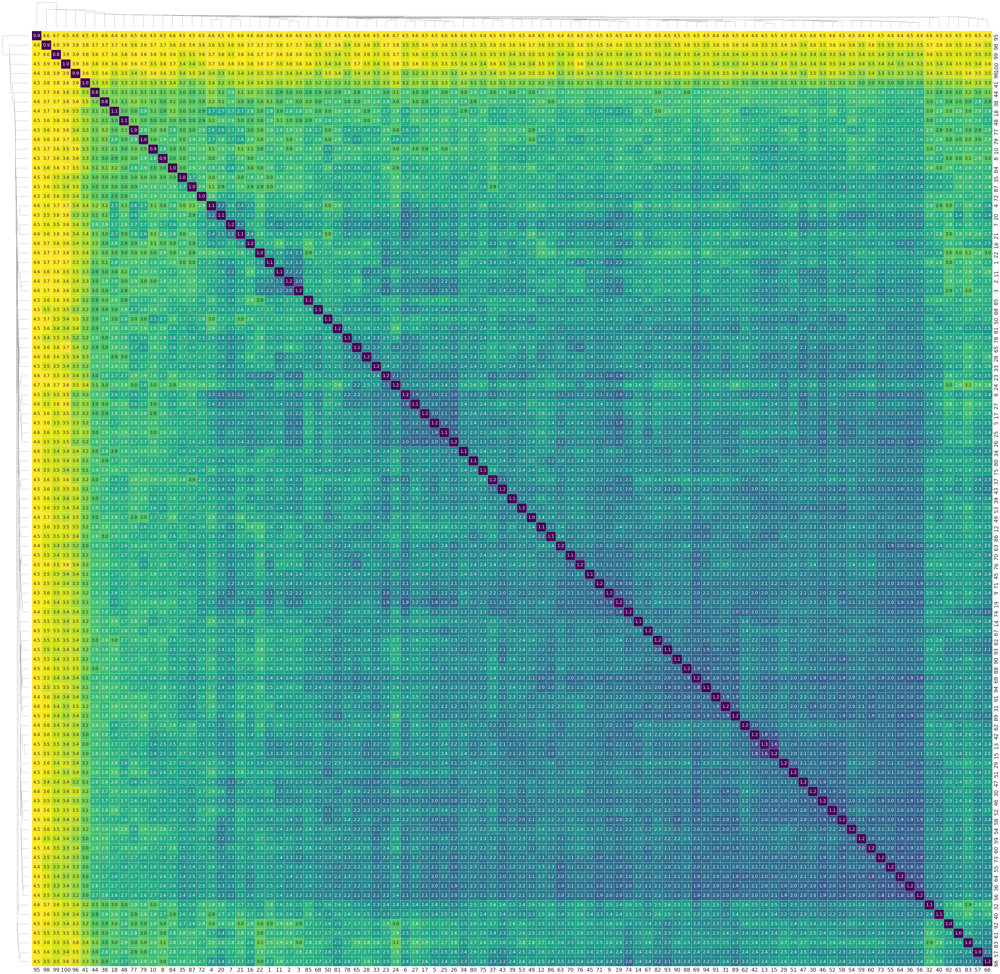

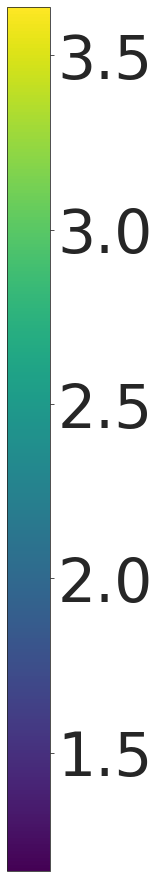

In [11]:
draw(30000)

In [12]:
distances = {}
entropies = {}
exclude = []
for size in [1000, 3000, 10000, 30000]:
    print(size)
    distances[size] = get_distances(size, exclude=exclude)
    entropies[size] = get_entropies(size, exclude=exclude)


1000
3000
10000
30000


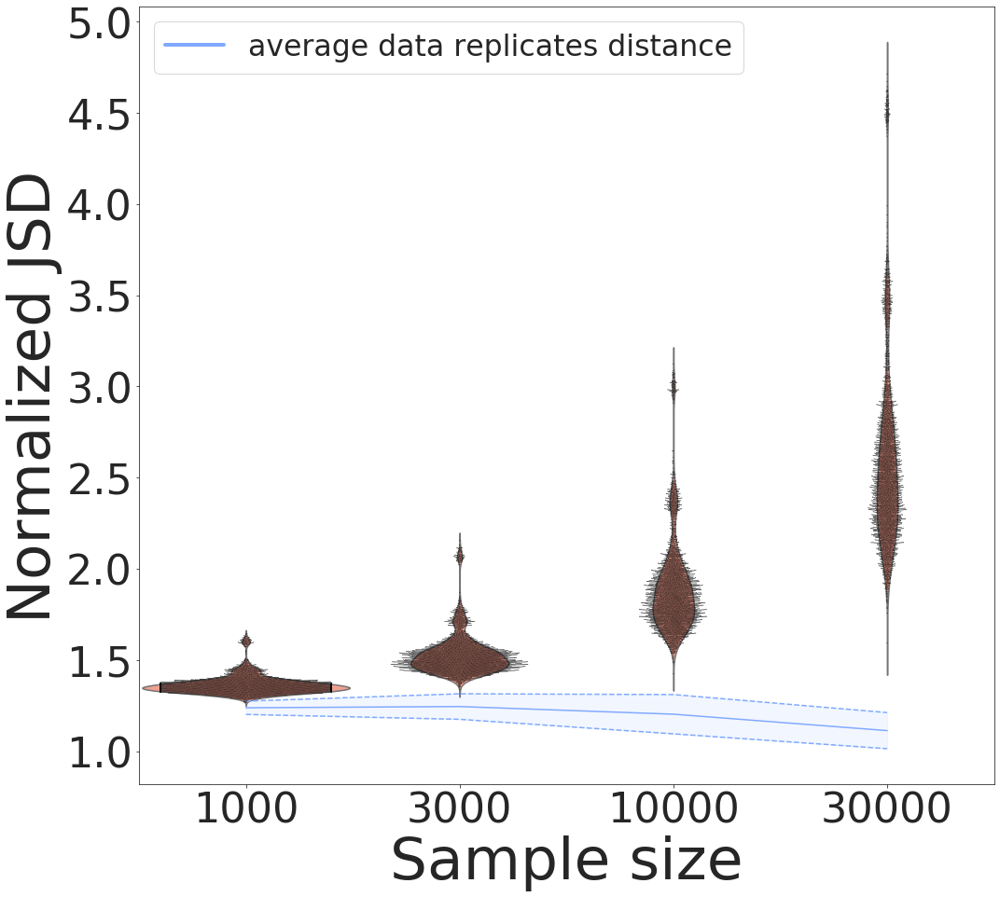

In [13]:
draw_violinplots(distances)

In [14]:
distances[30000]["unrelated"].min() / distances[30000]["synthetic"].mean(), \
distances[30000]["unrelated"].max() / distances[30000]["synthetic"].mean(), \
np.median(distances[30000]["unrelated"]) / distances[30000]["synthetic"].mean()

(1.5941141542056, 4.713268978957324, 2.4863701003969694)

In [15]:
n_sequences = 30000
prefix = DATA_DIR 
threshold = 0.01
main_models = {ind : genmodel.GenModel(model_parms_file=prefix + f"/S{ind}_{n_sequences}_run/main_inference/final_parms.txt",
                                       marginals_file=prefix + f"/S{ind}_{n_sequences}_run/main_inference/final_marginals.txt") for ind in inds}

models_alleles = {ind : {m.name for m in model.events[0].realizations \
                            if model.marginals[0]["v_choice"][m.index] > threshold}\
                     for ind, model in main_models.items()}

allele_distances = np.array([len(models_alleles[inds[i]] ^ models_alleles[inds[k]]) for i in range(len(inds)) for k in range(i+1, len(inds))])

SpearmanrResult(correlation=0.4300075915230627, pvalue=1.4047473172858148e-217)


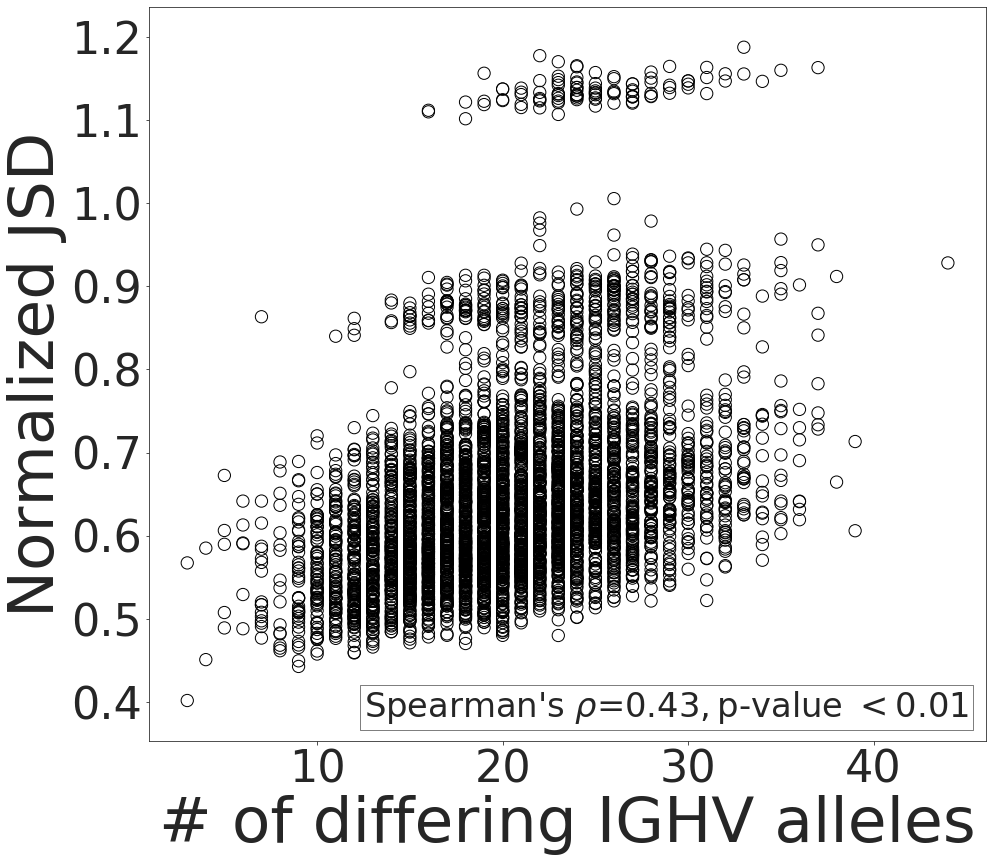

In [16]:
draw_correlation_with_alleles(distances, allele_distances)

# non-V

In [17]:
exclude = ["v_delv", "v_d_j"]
output_suffix="_non_V"

<Figure size 7200x7200 with 0 Axes>

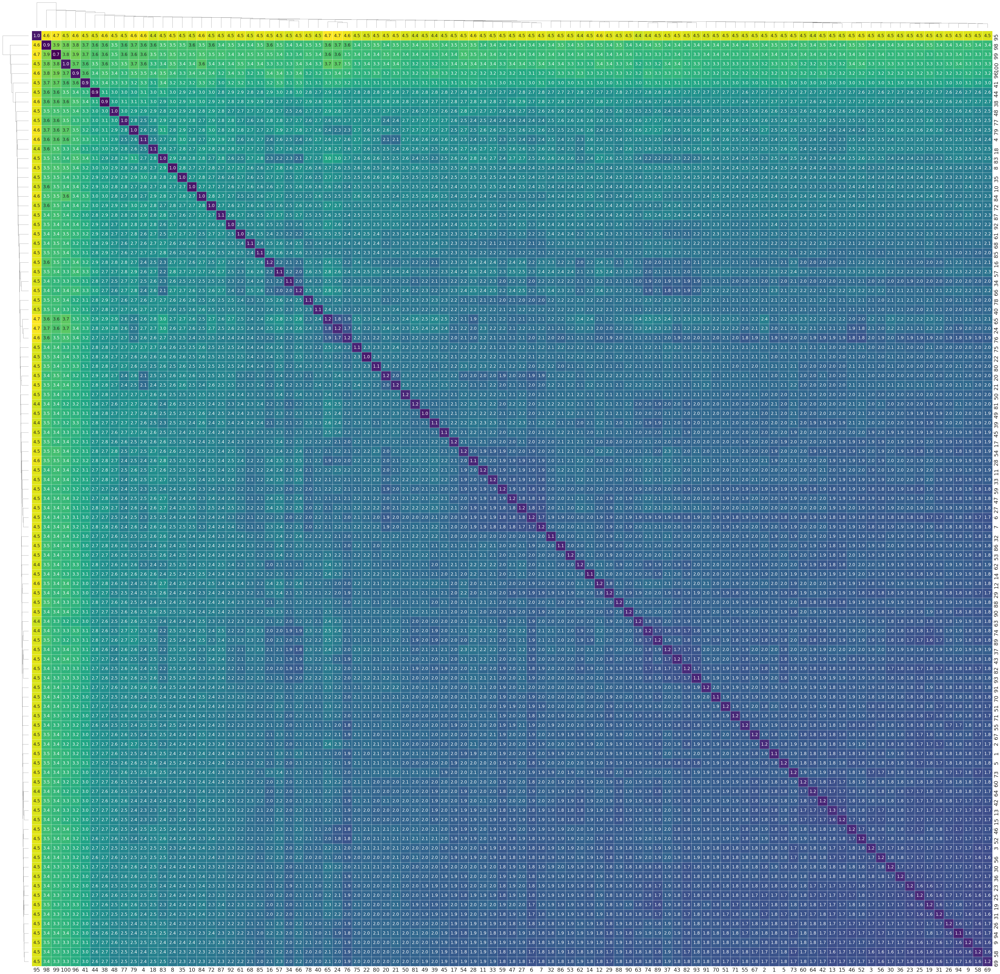

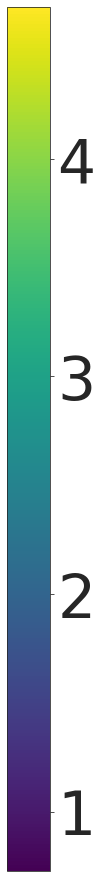

In [18]:
draw(30000, exclude=exclude, output_suffix=output_suffix)

In [19]:
distances_no_v = {}
for size in [1000, 3000, 10000, 30000]:
    distances_no_v[size] = get_distances(size, exclude=exclude)

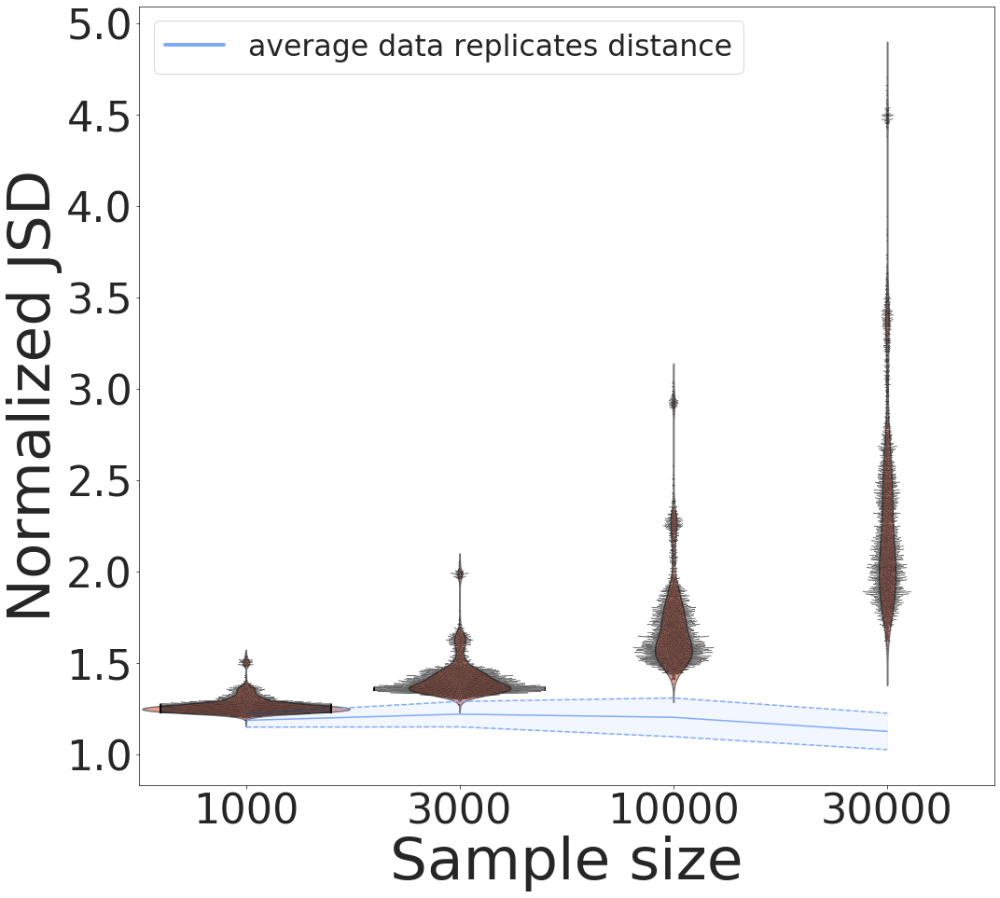

In [20]:
draw_violinplots(distances_no_v, output_suffix=output_suffix)

SpearmanrResult(correlation=0.18452147319678228, pvalue=2.0657248126265e-38)


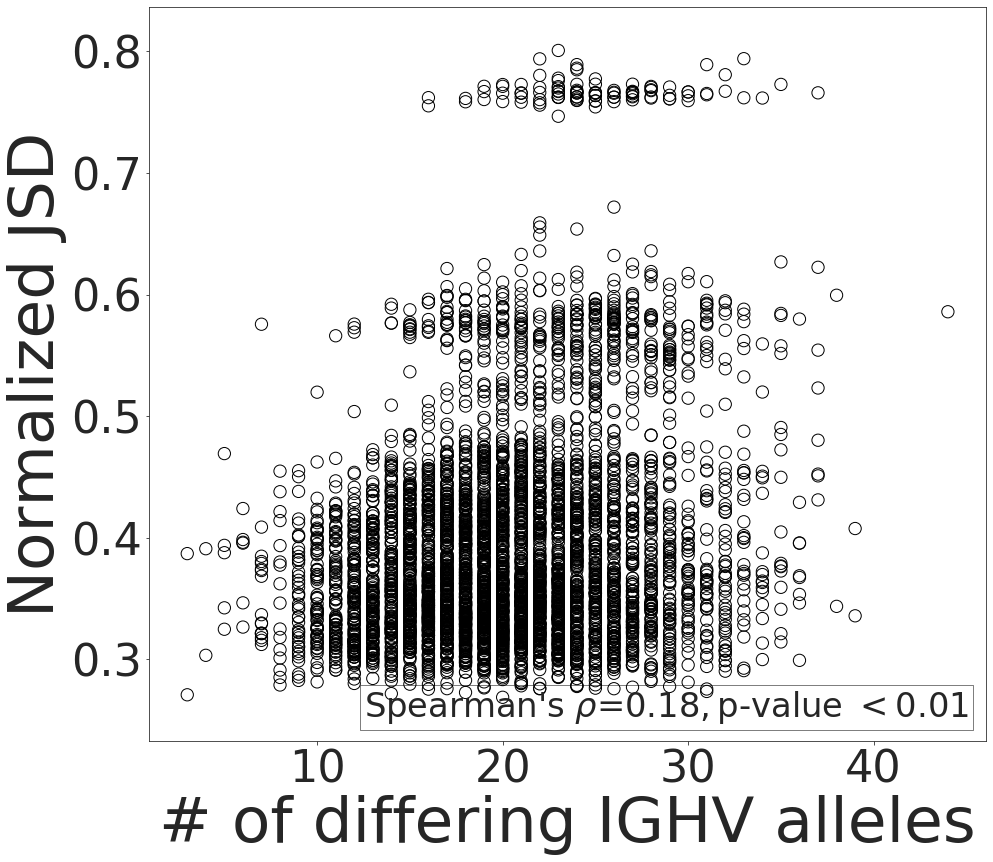

In [21]:
draw_correlation_with_alleles(distances_no_v, allele_distances, output_suffix=output_suffix)

# only-V

In [22]:
keys = {'v_delv', 'd_deld', 'dj_ins', 'j_delj', 'v_d_j', 'vd_ins'}

In [23]:
exclude = keys - {"v_delv", "v_d_j"}
output_suffix="_only_V"

<Figure size 7200x7200 with 0 Axes>

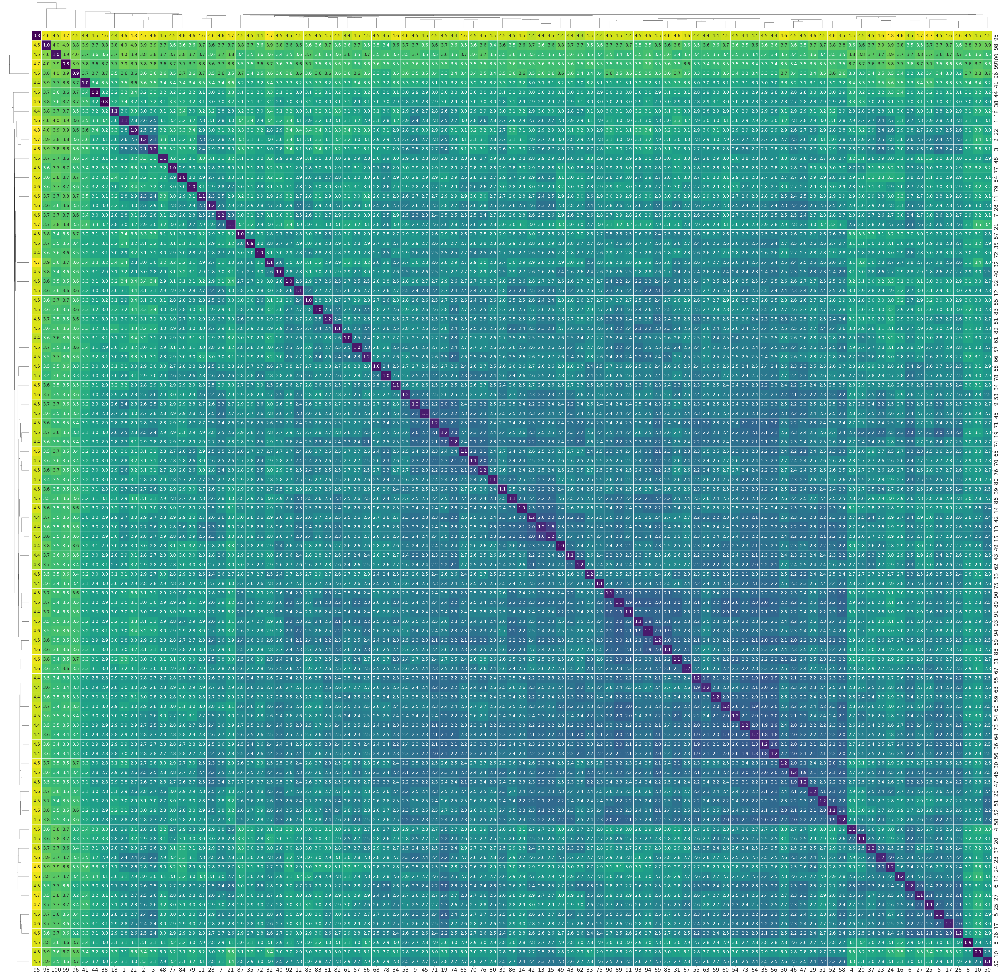

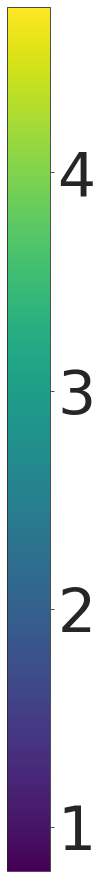

In [24]:
draw(30000, exclude=exclude, output_suffix=output_suffix)

In [25]:
distances_only_v = {}
for size in [1000, 3000, 10000, 30000]:
    distances_only_v[size] = get_distances(size, exclude=exclude)

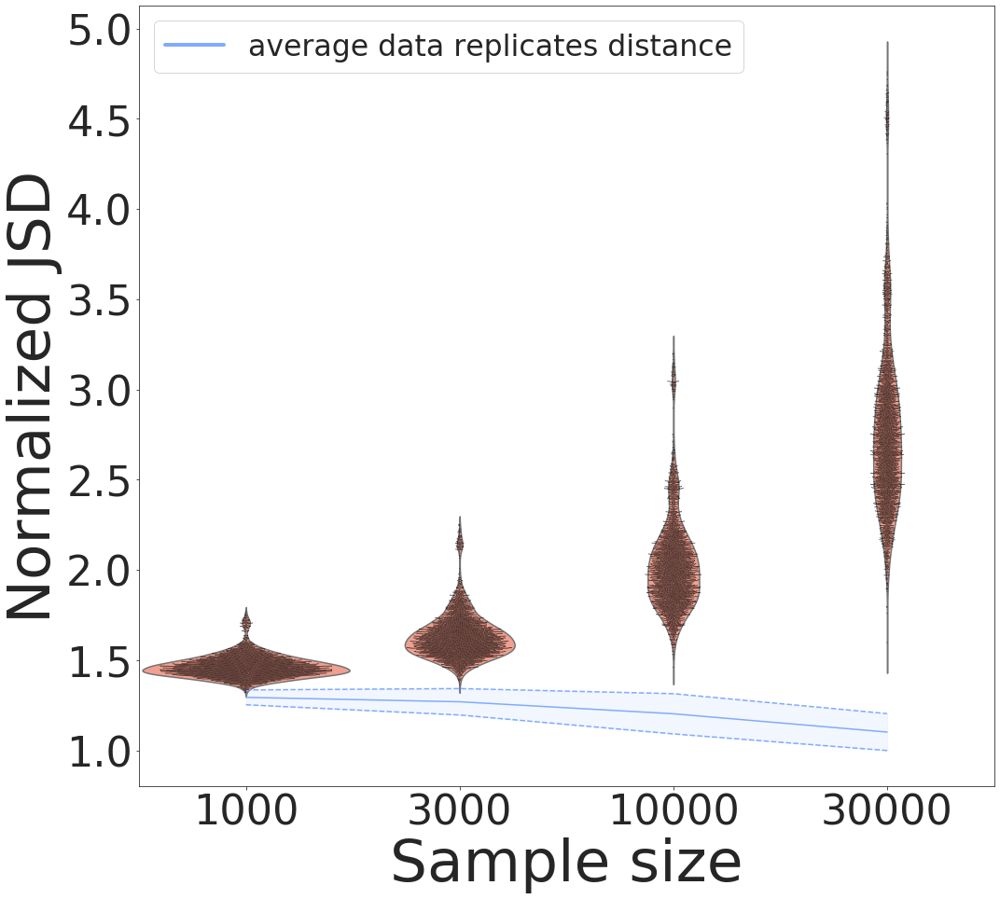

In [26]:
draw_violinplots(distances_only_v, output_suffix=output_suffix)

SpearmanrResult(correlation=0.5485375831408861, pvalue=0.0)


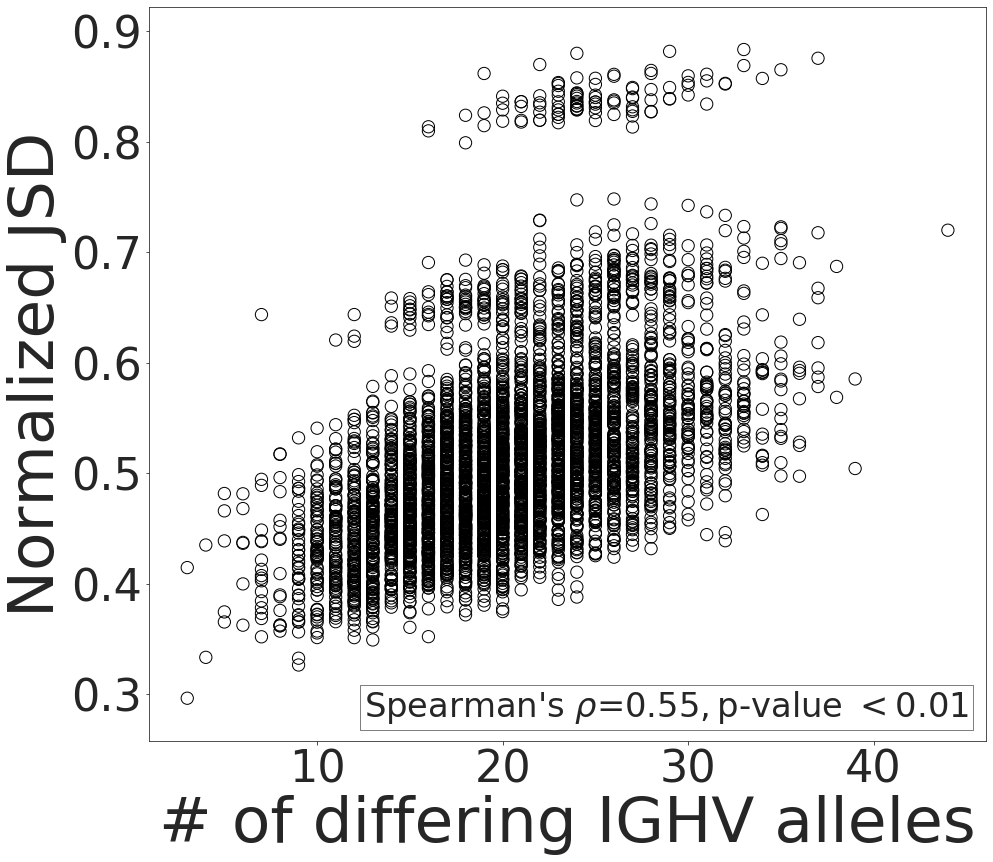

In [27]:
draw_correlation_with_alleles(distances_only_v, allele_distances, output_suffix=output_suffix)

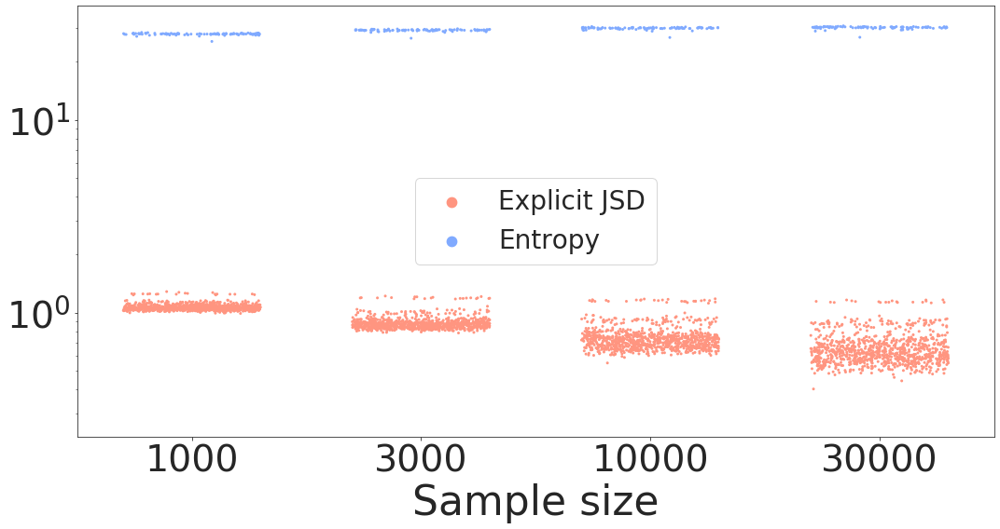

In [28]:
fontsize = 40
figsize = (15, 8)


sizes = [1000, 3000, 10000, 30000]
n_distances = distances[sizes[0]]["unrelated"].shape[0]
n_entropies = entropies[sizes[0]].shape[0]

x = "Sample size"
y = "bits"
hue = "hue"

ys = np.concatenate([distances[size]["unrelated"] for size in sizes])
n = ys.shape[0]
sub_indices = np.random.choice(np.arange(n), size=n // 5)
ys = ys[sub_indices]
xs = np.repeat(sizes, n_distances).astype(np.int64)
xs = xs[sub_indices]
df = pd.DataFrame(np.array([xs, ys]).T)
df.columns = [x, y]
df["hue"] = "Explicit JSD"
ys = np.concatenate([entropies[size] for size in sizes])
xs = np.repeat(sizes, n_entropies).astype(np.int64)
df_e = pd.DataFrame(np.array([xs, ys]).T)
df_e.columns = [x, y]
df_e["hue"] = "Entropy"
df = pd.concat([df, df_e], axis=0)

n = len(inds)
digits = 2
fig = plt.figure(figsize=figsize)

palette = [sample_type_to_color["unrelated"], sample_type_to_color["data"]]
ax = sns.stripplot(data=df, x=x, y=y, hue=hue, palette=palette, size=3, jitter=0.3)
# ax = sns.swarmplot(data=df, x=x, y=y, hue=hue, palette=palette, size=3)

plt.axhline(0, linestyle="--", color="grey")


ax = plt.gca()
ax.set_xlabel(x, fontsize=fontsize * 1.1)
ax.set_ylabel("", fontsize=fontsize * 0.1)

xlabels = [str(int(float(item.get_text()))) for item in ax.get_xticklabels()]
ax.set_xticklabels(xlabels)

plt.setp(ax.get_xticklabels(), fontsize=fontsize * 0.99)
plt.setp(ax.get_yticklabels(), fontsize=fontsize * 0.99)

leg = plt.legend(fontsize=fontsize * 0.7, loc="center")
for legobj in leg.legendHandles:
    legobj.set_linewidth(4.0)

plt.yscale("log")

plt.tight_layout()
plt.savefig(os.path.join(FIGURES_DIR, "entropies.png"), format="png")
plt.show()
